In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib 
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from sklearn import metrics
import itertools
from sklearn.decomposition import PCA
from scipy.sparse import csgraph
import umap
from collections import Counter
import sklearn
from importlib import reload
import sys

import gget

# locals
sys.path.append("../")
import utils as ut
reload(ut)

2023-06-16 09:51:29.046808: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-16 09:51:29.190956: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-06-16 09:51:29.190997: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2023-06-16 09:51:29.218041: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-06-16 09:51:30.736211: W tensorflow/stream_executor/pla

<module 'utils' from '/home/cstansbu/git_repositories/spatial_transcriptomics/clustering/validation/../utils.py'>

In [2]:
cardDir =  "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/CARDInputs/"
xyPath =  "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/combinedEmbedding.csv"
xy = pd.read_csv(xyPath)
cTypes = sorted(list(xy['cellTypes'].unique()))
print(cTypes)
print()

keys = ['ND', 'HFD8', 'HFD14']

rna = {}
labels = {}

for key in keys:
    print(f"{key}...")
    labelPath = f"{cardDir}{key}_macrophage_clusters.csv"
    lf = pd.read_csv(labelPath)
    
    lf = pd.merge(lf, xy[['x', 'y', 'cellId', 'colors']], 
                  how='left',
                  left_on='cellId',
                  right_on='cellId')
    
    labels[key] = lf
    
    rnaPath = f"{cardDir}{key}_macrophage_rna.csv"
    rf = pd.read_csv(rnaPath)
    rf = rf.T
    new_header = rf.iloc[0] 
    rf = rf[1:] 
    rf.columns = new_header 
    rf.index.names = ['cellId']
    
    rf = ut.normalize(rf, 1e6)
    
    rna[key] = rf

print('done')

['B cells', 'Dendritic cells', 'Macrophages', 'Monocytes', 'NK cells', 'Stromal cells', 'T cells']

ND...
HFD8...
HFD14...
done


In [3]:
keys = ['ND', 'HFD8', 'HFD14']

genes = []

for key in keys:
    rf = rna[key]
    
    # get genes with non-zero counts at all times
    colSums = rf.sum(axis=0)
    colInd = np.where(colSums > 0)[0]
    genes += rf.columns[colInd].to_list()
    
    
gf = pd.DataFrame(genes, columns=['gene'])
gf = gf.reset_index(drop=False)
gf = gf.groupby('gene')['index'].count().reset_index()

genes = gf[gf['index'] > 2]['gene'].to_list()

print(len(genes))

15644


In [4]:
dirPath = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/imgenProfiles/"

pfList = []
asscession = []

for f in os.listdir(dirPath):
    key = f.split("_")[0]
    fullPath = f"{dirPath}{f}"
    
    pf = pd.read_csv(fullPath)
    pf = pf.drop('ProbeSetID', axis=1, errors='ignore')
    
    # force similar column names
    if 'gene_symbol' in pf.columns:
        pf = pf.rename(columns={'gene_symbol' : 'gene'})
    else:
        pf = pf.rename(columns={'GeneSymbol' : 'gene'})
       
    pf['gene'] = pf['gene'].str.upper()
    
    pf = pf.drop_duplicates(subset='gene') # duplicate gene names
    
    pf = pf.set_index('gene')
    
    pf = pf.T
    pf = pf.reset_index(drop=False)
    pf['index'] = pf['index'] + f"_{key}"
    pf = pf.set_index("index")
    asscession.append(key)
    
    pfList.append(pf)

    
pf = pd.concat(pfList)
pf = pf.fillna(0)

# take just the genes expressed in our data
genes = [x for x in pf.columns if x in genes]
pf = pf[genes]
print(pf.shape)
pf.head()

(1824, 15604)


gene,0610009B22RIK,0610010F05RIK,0610010K14RIK,0610012D04RIK,0610012G03RIK,0610030E20RIK,0610038B21RIK,0610039K10RIK,0610040B10RIK,0610040J01RIK,...,TMEM57,TROVE2,TUSC5,USMG5,WISP1,WISP2,WRB,ZCCHC11,ZCCHC6,ZUFSP
index,,,,,,,,,,,,,,,,,,,,,
B.fo.Sp#1.1_GSE122597,14.994522,8.996869,15.994130,4.998435,54.978869,214.916258,3.998826,6.997652,12.995304,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.10_GSE122597,20.036660,31.934572,10.518330,9.328539,48.591649,273.462191,4.569374,8.138747,10.518330,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.11_GSE122597,14.182993,7.591496,15.501292,7.591496,49.777074,229.065777,1.000000,8.909796,16.819591,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.12_GSE122597,12.026471,42.900591,20.847648,4.307941,46.208532,221.529425,1.000000,18.642354,12.026471,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.13_GSE122597,29.818743,30.666353,12.866541,9.476101,59.485097,235.787996,1.000000,11.171321,2.695220,1.84761,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
print(", ".join(asscession))

GSE122597, GSE124829, GSE75202, GSE15907, GSE75203, GSE122108, GSE37448, GSE109125, GSE110549


In [6]:
# break

In [7]:
#pca on the immgen data
r = 40

pca = PCA(n_components=r)
X = ut.normalize(pf, 1e6)
pcaModel = pca.fit(X)
Xim = pcaModel.transform(X)
exVar = pcaModel.explained_variance_ratio_
print(f"{np.sum(exVar)*100=:.4f}% {exVar[:5]}")


""" UMAP """
# plotting params
n_components = 2 # should always be 2
n_neighbors = 35
min_dist = 0.99
metric= "euclidean"

umap_reducer = umap.UMAP(n_components=n_components,
                         n_neighbors=n_neighbors,
                         min_dist=min_dist,
                         metric=metric)

umapModel = umap_reducer.fit(Xim)
ef = umapModel.transform(Xim) 
ef = pd.DataFrame(ef)
ef.columns = ['x', 'y']
ef['id'] = pf.index
ef['type'] = ef['id'].apply(lambda x : str(x).split(".")[0])
ef['experiment'] = ef['id'].apply(lambda x : str(x).split("_")[1])

cellMapper = {
    'MF' : 'Macrophages',
    'T' : 'T cells',
    'DC' : 'Dendritic cells',
    'B' : 'B cells',
    'Mo' : 'Monocytes',
    'NK' : 'NK cells',
    "MC" : "Monocytes"
}

ef['cellType'] = ef['type'].map(cellMapper)

print(ef.head())

np.sum(exVar)*100=96.1848% [0.33506778 0.12288002 0.10238839 0.07795877 0.06313948]
           x          y                      id type experiment cellType
0  17.150503  12.376574   B.fo.Sp#1.1_GSE122597    B  GSE122597  B cells
1  17.765383  11.539715  B.fo.Sp#1.10_GSE122597    B  GSE122597  B cells
2  17.876398  11.793135  B.fo.Sp#1.11_GSE122597    B  GSE122597  B cells
3  18.146635  11.767015  B.fo.Sp#1.12_GSE122597    B  GSE122597  B cells
4  17.981564  11.732347  B.fo.Sp#1.13_GSE122597    B  GSE122597  B cells


In [8]:
ef['cellType'].value_counts().head(10)

cellType
Macrophages        412
T cells            223
Dendritic cells    204
Monocytes          141
B cells            118
NK cells            89
Name: count, dtype: int64

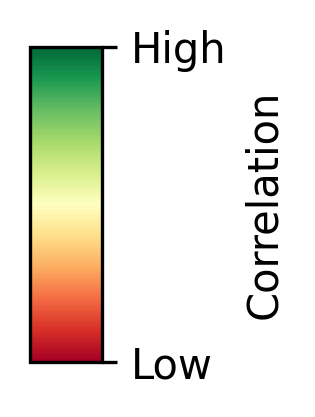

In [9]:
def makeColorbar(cmap, width, hieght, title, orientation, tickLabels):
    a = np.array([[0,1]])
    plt.figure(figsize=(width, hieght))
    img = plt.imshow(a, cmap=cmap)
    plt.gca().set_visible(False)
    cax = plt.axes([0.1, 0.2, 0.8, 0.6])
    ticks = np.linspace(0,1 , len(tickLabels))
    cbar = plt.colorbar(orientation=orientation, 
                        cax=cax, 
                        label=title,
                        ticks=ticks)

    if orientation == 'vertical':
        cbar.ax.set_yticklabels(tickLabels)
    else:
        cbar.ax.set_xticklabels(tickLabels)
        
plt.rcParams['figure.dpi'] = 300
makeColorbar("RdYlGn", 0.3, 1.75, 'Correlation', 'vertical', ["Low", "High"])

<AxesSubplot: xlabel='x', ylabel='y'>

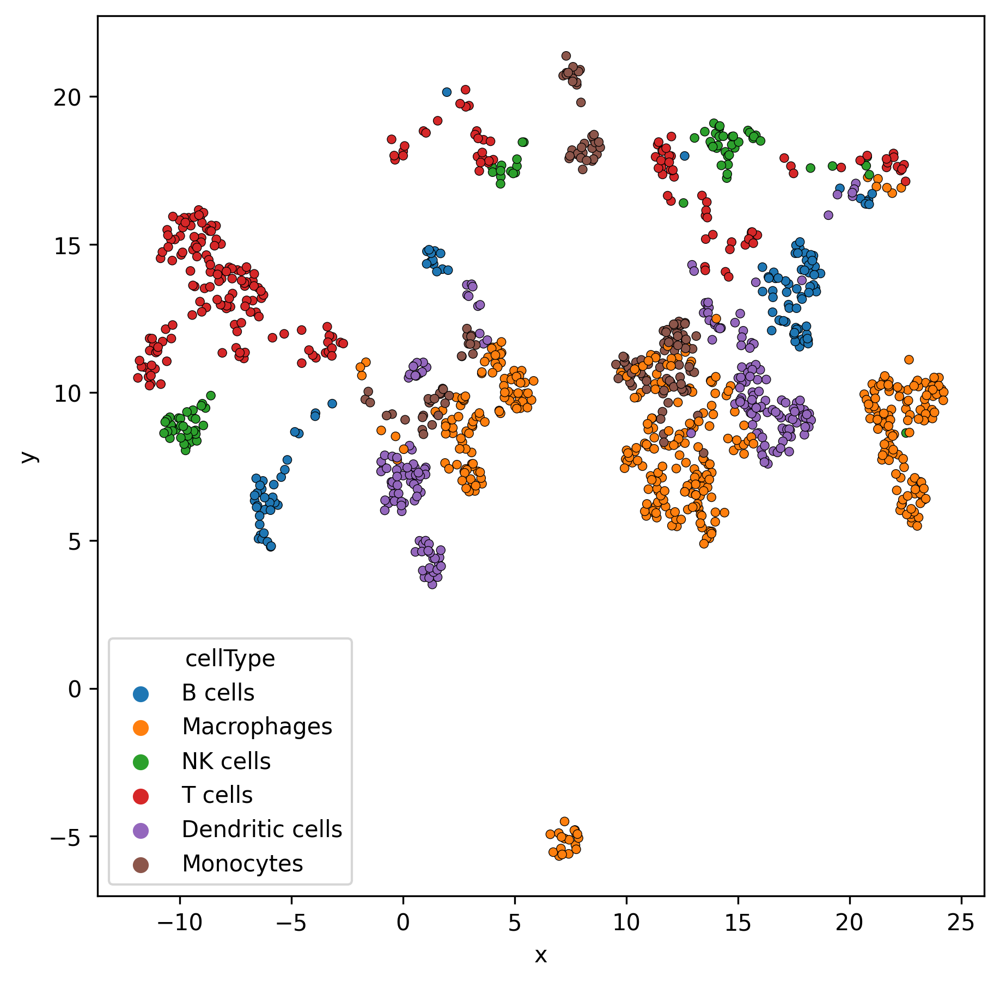

In [10]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 7
plt.rcParams['figure.facecolor'] = "w"

mask = ef['cellType'].notna()

centers = ef[mask].groupby('cellType').agg(
    x = ('x', 'mean'),
    y = ('y', 'mean')
).reset_index()

sns.scatterplot(data=ef[mask], 
                x='x', 
                y='y', 
                s=15,
                ec='k',
                linewidths=.1,
                hue='cellType')

# sns.scatterplot(data=centers, 
#                 x='x', 
#                 y='y', 
#                 s=200,
#                 ec='k',
#                 linewidths=.1,
#                 legend=False,
#                 hue='cellType')

In [11]:
# break

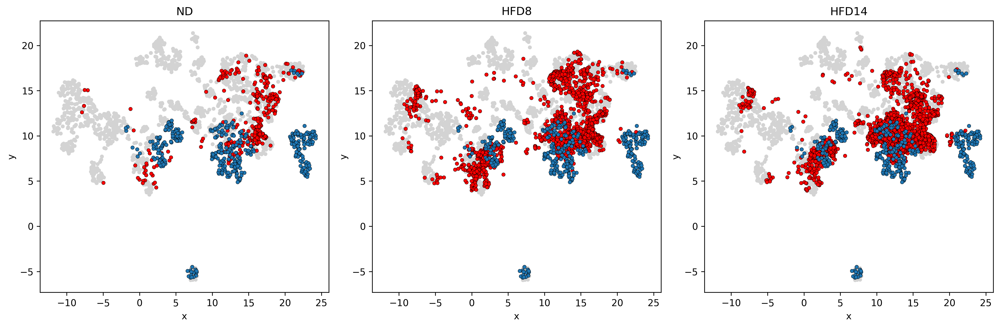

In [12]:
keys = ['ND', 'HFD8', 'HFD14']

typeList = [
    'Mac1',
    'Mac2',
    'Mac3',
    'Mac4',
    'Mac5',
]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 5
plt.rcParams['figure.facecolor'] = "w"

fig, axs = plt.subplots(1, 3)
axs = axs.ravel()

for i, key in enumerate(keys):
    
    rf = rna[key]
    lf = labels[key]
    lf = lf.drop_duplicates(subset='cellId')
    
    rf = rf[rf.index.isin(lf['cellId'])]
    lf = lf[lf['cellId'].isin(rf.index)]
    
    
    rf = rf[genes]
    
    Xdata = pcaModel.transform(rf)
    embed = umapModel.transform(Xdata) 
    
    embed = pd.DataFrame(embed)
    embed.columns = ['x', 'y']
    lf['x'] = embed['x']
    lf['y'] = embed['y']
    
    # print(lf.head())
    
    mask = (lf['cellType'].isin(typeList))
    
    sns.scatterplot(data=lf[mask],
                    x='x',
                    y='y',
                    s=15, 
                    color='r',
                    ec='k', 
                    ax=axs[i])
    
    mask = (ef['cellType'] == 'Macrophages')
    
    sns.scatterplot(data=ef[mask],
                    x='x',
                    y='y',
                    s=15, 
                    color='C0',
                    ec='k',
                    ax=axs[i])
    
    sns.scatterplot(data=ef[~mask],
                     x='x',
                     y='y',
                     s=15, 
                     color='lightgrey',
                     ec='lightgrey', 
                     zorder=-1,
                     ax=axs[i])
    
    axs[i].set_title(key)
    
plt.tight_layout()

(1261, 1187)


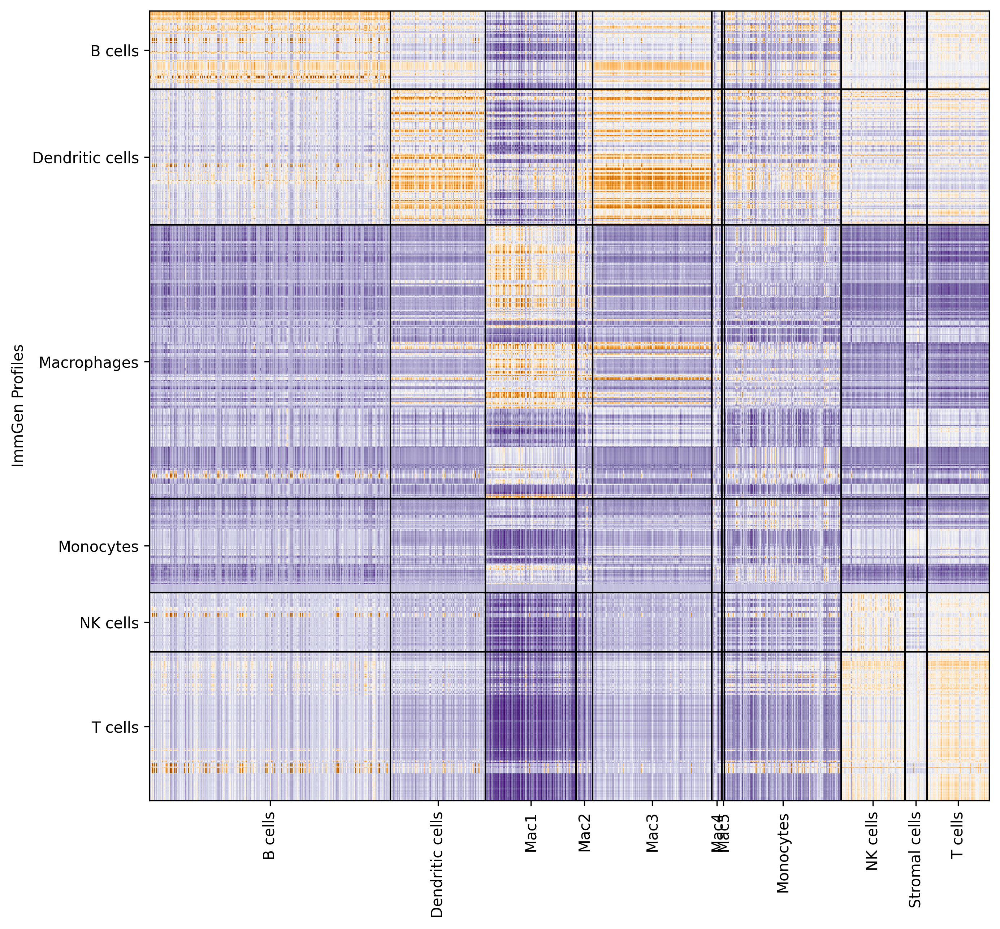

done


In [13]:
distDict = {}
distInds = {}

for i, key in enumerate(keys):
    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 10,10
    plt.rcParams['figure.facecolor'] = "w"
    
    fig, axs = plt.subplots(1, 1)
    
    rf = rna[key]
    lf = labels[key]
    lf = lf.drop_duplicates(subset='cellId')
    
    rf = rf[rf.index.isin(lf['cellId'])]
    lf = lf[lf['cellId'].isin(rf.index)].reset_index(drop=True)
    
    rf = rf[genes]
    
    # make sure they're sorted in the same order 
    assert(np.all(rf.index == lf['cellId']))
    
    Xdata = pcaModel.transform(rf)
    
    # only test against a subset
    mask = ef['cellType'].notna()
    ind = ef[mask].index
    
    # dists is our data x immgen data
    dists = sklearn.metrics.pairwise_distances(Xdata, Xim, metric='correlation')
    
    # sort the distance matrix by cell type (columns)
    colSortInd = ef[mask].sort_values(by='cellType').index
    
    dists = dists[:, colSortInd]
    
    # sort the distance matrix by cell type (rows)
    rowSortInd = lf.sort_values(by='cellType').index
    dists = dists[rowSortInd, :]
    
    print(dists.shape)
    
    # normalize the distances
    dists = (dists - np.min(dists))/np.ptp(dists)
    axs.imshow(dists.T, cmap='PuOr')
    
    distDict[key] = dists.T
    
     # get col switches 
    ef = ef[mask].sort_values(by='cellType')
    ef['codes'] = ef['cellType'].astype('category').cat.codes
    colNames = list(ef['cellType'].unique())
    v = ef['codes'].to_numpy()
    colSwitches = np.where(v[:-1] != v[1:])[0]
    
    # row switches
    lf = lf.sort_values(by='cellType')
    lf['codes'] = lf['cellType'].astype('category').cat.codes
    v = lf['codes'].to_numpy()
    rowSwitches = np.where(v[:-1] != v[1:])[0]
    rowNames = list(lf['cellType'].unique())
    
    # plot cell type boundaries
    xticks = []
    rowSwitches = np.append(rowSwitches, dists.shape[0])
    lastVal = 0
    for j in range(len(rowSwitches)):
        curr = rowSwitches[j] 
        mid = ((curr - lastVal) / 2) + lastVal
        xticks.append(mid)
        if not curr == np.max(rowSwitches):
            axs.axvline(x=curr, c='k', lw=1)
        lastVal = curr
    
    axs.set_xticks(xticks)
    axs.set_xticklabels(rowNames, rotation=90)

    # plot cell type boundaries
    yticks = []
    colSwitches = np.append(colSwitches, dists.shape[1])
    lastVal = 0
    for j in range(len(colSwitches)):
        curr = colSwitches[j] 
        mid = ((curr - lastVal) / 2) + lastVal
        yticks.append(mid)
        if not curr == np.max(colSwitches):
            axs.axhline(y=curr, c='k', lw=1)
        lastVal = curr
        
    axs.set_yticks(yticks)
    axs.set_yticklabels(colNames)
    axs.set_ylabel('ImmGen Profiles')
    plt.show()
    
    # prepare data for the next cell
    distInds[key] = {
        'colSwitches' : colSwitches,
        'colNames' : colNames,
        'lf' : lf, 
    }
    
    break
    
print('done')

In [14]:
pf[genes].head()

gene,0610009B22RIK,0610010F05RIK,0610010K14RIK,0610012D04RIK,0610012G03RIK,0610030E20RIK,0610038B21RIK,0610039K10RIK,0610040B10RIK,0610040J01RIK,...,TMEM57,TROVE2,TUSC5,USMG5,WISP1,WISP2,WRB,ZCCHC11,ZCCHC6,ZUFSP
index,,,,,,,,,,,,,,,,,,,,,
B.fo.Sp#1.1_GSE122597,14.994522,8.996869,15.994130,4.998435,54.978869,214.916258,3.998826,6.997652,12.995304,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.10_GSE122597,20.036660,31.934572,10.518330,9.328539,48.591649,273.462191,4.569374,8.138747,10.518330,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.11_GSE122597,14.182993,7.591496,15.501292,7.591496,49.777074,229.065777,1.000000,8.909796,16.819591,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.12_GSE122597,12.026471,42.900591,20.847648,4.307941,46.208532,221.529425,1.000000,18.642354,12.026471,1.00000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
B.fo.Sp#1.13_GSE122597,29.818743,30.666353,12.866541,9.476101,59.485097,235.787996,1.000000,11.171321,2.695220,1.84761,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [15]:
idf = pf[pf.index.isin(ef['id'])][genes]
print(f"{idf.shape=}")

res = []

maccys = ["Mac1", "Mac2", "Mac3", "Mac4", "Mac5"]


for i, key in enumerate(keys):

    rf = rna[key]
    lf = labels[key]
    lf = lf.drop_duplicates(subset='cellId')
    
    rf = rf[rf.index.isin(lf['cellId'])]
    lf = lf[lf['cellId'].isin(rf.index)].reset_index(drop=True)
    lf['metaType'] = np.where(lf['cellType'].isin(maccys), 'Macrophages', lf['cellType'])
    
    rf = rf[genes]
    
    # make sure they're sorted in the same order 
    assert(np.all(rf.index == lf['cellId']))
    idf = idf.reindex(ef['id'])
    assert(np.all(idf.index == ef['id']))
    
    for ctype in lf['metaType'].unique():
        for itype in ef['cellType'].unique():
            
            # the average cell of ours
            mask = lf['metaType'] == ctype
            cind = lf[mask]['cellId'].to_list()
            
            cexp = rf[rf.index.isin(cind)].mean(axis=0)
            
            # the average immgen profile
            mask = ef['cellType'] == itype
            iind = ef[mask]['id'].to_list()
            
            iexp = idf[idf.index.isin(iind)].mean(axis=0)
            
            stat, pval = scipy.stats.pearsonr(cexp, iexp)
            
            row = {
                'key' : key, 
                'cellType' : ctype,
                'immgenType' : itype, 
                'correlation' : stat,
                'pval' : pval
            }
            
            res.append(row)
        
res = pd.DataFrame(res)
res.head()

idf.shape=(1187, 15604)


,key,cellType,immgenType,correlation,pval
0,ND,B cells,B cells,0.530419,0.000000e+00
1,ND,B cells,Dendritic cells,0.136816,4.459592e-66
2,ND,B cells,Macrophages,0.067816,2.244398e-17
3,ND,B cells,Monocytes,0.081286,2.700944e-24
4,ND,B cells,NK cells,0.117132,8.525495e-49


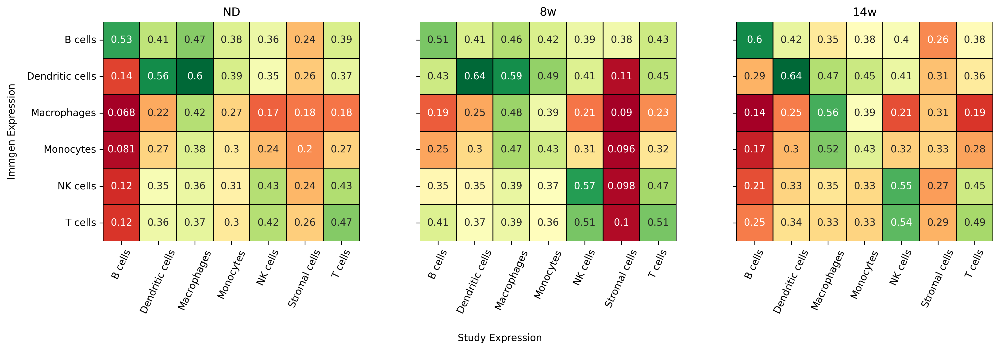

In [16]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 4.5
plt.rcParams['figure.facecolor'] = "w"


fig, axs = plt.subplots(1, 3, sharey=True)
axs = axs.ravel()

titles = ['ND', '8w', '14w']

for i, key in enumerate(keys):
    mask = (res['key'] == key)
    
    table = pd.pivot_table(res[mask], 
                           values='correlation', 
                           index=['immgenType'],
                           columns=['cellType'])

    sns.heatmap(data=table,
                cmap='RdYlGn', 
                linewidth=0.5,
                linecolor='k',
                annot=True,
                square=True,
                # vmin=0,
                # vmax=0.005,
                cbar=False,
                ax=axs[i])
    
    axs[i].set_title(titles[i])
    if i == 0:
        axs[i].set_ylabel("Immgen Expression", labelpad=10)
    else:
        axs[i].set_ylabel("")
    axs[i].set_xlabel("")
    axs[i].tick_params(axis='x', rotation=65)
        
fig.supxlabel("Study Expression", y=-0.05, fontsize=10)
    
plt.tight_layout()

In [18]:
res.head()

outdir = "/nfs/turbo/umms-indikar/shared/projects/spatial_transcriptomics/data/FIGURE_DATA/SUPP/"
fname = "immgen_correlations.csv"
res.to_csv(f"{outdir}{fname}", index=False,)
res.head()

,key,cellType,immgenType,correlation,pval
0,ND,B cells,B cells,0.530419,0.000000e+00
1,ND,B cells,Dendritic cells,0.136816,4.459592e-66
2,ND,B cells,Macrophages,0.067816,2.244398e-17
3,ND,B cells,Monocytes,0.081286,2.700944e-24
4,ND,B cells,NK cells,0.117132,8.525495e-49


In [17]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
table = res[res['cellType'] == res['immgenType']]

print(table.columns)
table = table[['cellType', 'key', 'correlation',]]
table = table.sort_values(by=['cellType', 'key'], ascending=[True, False])

print(table.round(5).to_latex())

In [ ]:
table = pd.pivot_table(res, 
                       values='correlation', 
                       index=['immgenType', 'key'],
                       columns=['cellType']).reset_index(drop=False)

table = table.sort_values(by=['immgenType', 'key'], ascending=[True, False])

print(table.round(3).to_latex())


In [ ]:
break

In [ ]:
res = []

for key in keys:
    d = distDict[key]
    
    colSwitches = distInds[key]['colSwitches']
    colNames = distInds[key]['colNames']
    lf = distInds[key]['lf']
    
    
    for ctype in lf['cellType'].unique():
        mask = (lf['cellType'] == ctype)
        cix = list(lf[mask].index)
        cnix = list(lf[~mask].index)
        
        colNum = 0
        for i in range(len(colSwitches)):
            lb = np.min([colNum, colSwitches[i]]) 
            ub = colSwitches[i] - 1
            cName = colNames[i]

            colNum = colSwitches[i]
            
            ingroup = d[lb:ub, :][:, cix]
            outgroup = d[lb:ub, :][:, cnix]
            
            print(ingroup.shape, outgroup.shape)
            
            stat, val = scipy.stats.ranksums(ingroup.ravel(), outgroup.ravel())
            
            
            print(ctype, cName, stat, val)
            sns.histplot(ingroup.ravel(), alpha=0.5)
            sns.histplot(outgroup.ravel(), color="C2", alpha=0.5)
            
            break
        break
            
#             row = {
#                 'key' : key,
#                 'Our Cell' : ctype,
#                 'Immgen Cell' : cName,
#                 'n Our' : ingroup.shape[1],
#                 'n Immgen' : ingroup.shape[0],
#                 'inGroup' : ingroup.max(),
#                 'outGroup' : outgroup.max(),
#                 'log2foldchange' : np.log2(ingroup.max()) - np.log2(outgroup.max()),
#             }
            
#             res.append(row)
    
# res = pd.DataFrame(res)
# print(res.shape)
# res.head()

In [ ]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 15, 4
plt.rcParams['figure.facecolor'] = "w"

fig, axs = plt.subplots(1, 3, sharey=True)
axs = axs.ravel()

for i, key in enumerate(keys):
    mask = (res['key'] == key)
    
    table = pd.pivot_table(res[mask], 
                           values='log2foldchange', 
                           index=['Immgen Cell'],
                           columns=['Our Cell'])

    sns.heatmap(data=table,
                cmap='RdYlGn', 
                linewidth=0.5,
                linecolor='k',
                # vmin=0,
                # vmax=0.005,
                cbar=False,
                ax=axs[i])

In [ ]:
np.max(idf.index)

In [ ]:
len(idf)